# Census Income Project

Problem Statement:


This data was extracted from the 1994 Census bureau database by Ronny Kohavi and Barry Becker (Data Mining and Visualization, Silicon Graphics). A set of reasonably clean records was extracted using the following conditions: ((AAGE>16) && (AGI>100) && (AFNLWGT>1) && (HRSWK>0)). The prediction task is to determine whether a person makes over $50K a year.

Description of fnlwgt (final weight)
The weights on the Current Population Survey (CPS) files are controlled to independent estimates of the civilian non-institutional population of the US. These are prepared monthly for us by Population Division here at the Census Bureau. We use 3 sets of controls. These are:

A single cell estimate of the population 16+ for each state.

Controls for Hispanic Origin by age and sex.

Controls by Race, age and sex.

We use all three sets of controls in our weighting program and "rake" through them 6 times so that by the end we come back to all the controls we used. The term estimate refers to population totals derived from CPS by creating "weighted tallies" of any specified socio-economic characteristics of the population. People with similar demographic characteristics should have similar weights. There is one important caveat to remember about this statement. That is that since the CPS sample is actually a collection of 51 state samples, each with its own probability of selection, the statement only applies within state.

# Importing Libraries

In [595]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.metrics import classification_report
from scipy.stats import skew
from sklearn.preprocessing import power_transform
import plotly.graph_objects as go
from plotly import tools
from plotly.subplots import make_subplots
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import power_transform
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
import statistics
from sklearn.metrics import roc_auc_score
from sklearn.metrics import accuracy_score,confusion_matrix,f1_score,mean_squared_error,roc_curve,precision_recall_curve
from sklearn import model_selection
from sklearn.ensemble import VotingClassifier
import warnings
warnings.filterwarnings("ignore")

# Importing Dataset

In [558]:
cen=pd.read_csv("census_income.csv")


In [559]:
cen.head()

,Age,Workclass,Fnlwgt,Education,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country,Income
0,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
1,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
2,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
3,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
4,37,Private,284582,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,0,0,40,United-States,<=50K


First 5 rows of dataset

In [560]:
cen.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32560 entries, 0 to 32559
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Age             32560 non-null  int64 
 1   Workclass       32560 non-null  object
 2   Fnlwgt          32560 non-null  int64 
 3   Education       32560 non-null  object
 4   Education_num   32560 non-null  int64 
 5   Marital_status  32560 non-null  object
 6   Occupation      32560 non-null  object
 7   Relationship    32560 non-null  object
 8   Race            32560 non-null  object
 9   Sex             32560 non-null  object
 10  Capital_gain    32560 non-null  int64 
 11  Capital_loss    32560 non-null  int64 
 12  Hours_per_week  32560 non-null  int64 
 13  Native_country  32560 non-null  object
 14  Income          32560 non-null  object
dtypes: int64(6), object(9)
memory usage: 3.7+ MB


the dataset has 32560 rows and 15 columns

there are no null values in the above dataset 

In [561]:
cen.drop('Fnlwgt', axis=1, inplace=True)
cen.replace({' ?':'Unknown'}, inplace=True)

Droping fnlwgt columns as it's not important for future  analysis.
also replacing ? values with unknown in dataset

In [562]:
cen.describe(include='all')

,Age,Workclass,Education,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country,Income
count,32560.000000,32560,32560,32560.000000,32560,32560,32560,32560,32560,32560.000000,32560.000000,32560.000000,32560,32560
unique,NaN,9,16,NaN,7,15,6,5,2,NaN,NaN,NaN,42,2
top,NaN,Private,HS-grad,NaN,Married-civ-spouse,Prof-specialty,Husband,White,Male,NaN,NaN,NaN,United-States,<=50K
freq,NaN,22696,10501,NaN,14976,4140,13193,27815,21789,NaN,NaN,NaN,29169,24719
mean,38.581634,NaN,NaN,10.080590,NaN,NaN,NaN,NaN,NaN,1077.615172,87.306511,40.437469,NaN,NaN
std,13.640642,NaN,NaN,2.572709,NaN,NaN,NaN,NaN,NaN,7385.402999,402.966116,12.347618,NaN,NaN
min,17.000000,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,1.000000,NaN,NaN
25%,28.000000,NaN,NaN,9.000000,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,40.000000,NaN,NaN
50%,37.000000,NaN,NaN,10.000000,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,40.000000,NaN,NaN
75%,48.000000,NaN,NaN,12.000000,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,45.000000,NaN,NaN


In [563]:
cen.isna().sum()

Age               0
Workclass         0
Education         0
Education_num     0
Marital_status    0
Occupation        0
Relationship      0
Race              0
Sex               0
Capital_gain      0
Capital_loss      0
Hours_per_week    0
Native_country    0
Income            0
dtype: int64

the above observation shows there are no nan values present in entire dataset

In [564]:
professional_columns = ['Workclass','Education','Education_num','Occupation','Capital_gain','Capital_loss','Hours_per_week','Income']

personal_columns = ['Age','Marital_status','Relationship','Race','Sex','Native_country']

print('\n',professional_columns)
print('\n',personal_columns)


 ['Workclass', 'Education', 'Education_num', 'Occupation', 'Capital_gain', 'Capital_loss', 'Hours_per_week', 'Income']

 ['Age', 'Marital_status', 'Relationship', 'Race', 'Sex', 'Native_country']


the columns are divided in 2 categories for further analysis

In [565]:
professional_columns =cen[professional_columns]
personal_columns =cen[personal_columns]

moving data in above 2 categories

In [566]:
pay = professional_columns['Income'].value_counts()
fig = px.bar(x=pay.index, y=pay, title='Total Income Distribution', text=(professional_columns['Income'].value_counts()/len(professional_columns['Income'])*100))
fig['layout'].update(height=500, width=500)
fig.update_traces(textposition='outside',texttemplate='%{text:.4s}', marker_color=['orange','red'])
fig.show()

The above observation shows the number people with income less than and equal to 50k is more than that of people with income greater than 50k


There seems to be slight imbalance in data.

In [567]:
plot1 = go.Bar(x=professional_columns['Workclass'].value_counts().index, y=professional_columns['Workclass'].value_counts(), 
                text=(professional_columns['Workclass'].value_counts()/len(professional_columns['Workclass'])*100))

plot2 = go.Bar(x=professional_columns['Education'].value_counts().index, y=professional_columns['Education'].value_counts(),text=(professional_columns['Education'].value_counts()/len(professional_columns['Education'])*100))

plot3 = go.Bar(x=professional_columns['Occupation'].value_counts().index, y=professional_columns['Occupation'].value_counts(),text=(professional_columns['Occupation'].value_counts()/len(professional_columns['Occupation'])*100))


fig = make_subplots(rows=2, cols=2, specs=[[{'type':'bar'},{'type':'bar'}],
                                          [{'type':'bar'},None]],
                   subplot_titles=('Work Class Distribution','Education Distribution','Occupation Distribution'))
fig.append_trace(plot1,1,1)
fig.append_trace(plot2,1,2)
fig.append_trace(plot3,2,1)

fig['layout'].update(height=1100, width=1200,title='Professional Analysis')

fig.update_traces(marker_color=['orange','yellow','pink','blue','green','lightseagreen','red','brown','olive','mintcream','mistyrose','cornflowerblue'],
                  textposition='outside',texttemplate='%{text:.4s}%')
fig.show()

The above observation shows the percentage distribution of work class column , education and occupation column

According to the observation  around 69.7% people are working privately.

Around 32.2% where high school graduates and 22.39% are collage graduates.

Prof-specialty, Craft-repair, and Exec-management occuaption are higher in count than other occupations.

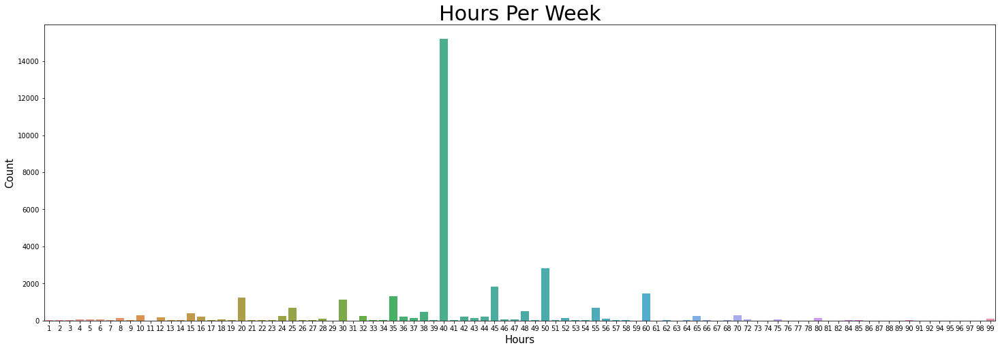

In [568]:
plt.figure(figsize=(25,8))
sns.countplot(x=professional_columns['Hours_per_week'])
plt.title('Hours Per Week', fontsize=30)
plt.xlabel('Hours', fontsize=15)
plt.ylabel('Count', fontsize=15)
plt.show()

The above observation shows that most people do 40 Hours per week.

In [569]:
fig = px.histogram(x=professional_columns['Workclass'], color=professional_columns['Income'],color_discrete_sequence=['blue','red'], height=400, width=700, title='Work Class VS Income',
                  labels={'Work':'Work'})
fig.show()

fig = px.histogram(x=professional_columns['Occupation'], color=professional_columns['Income'],color_discrete_sequence=['blue','green'], height=400, width=700, title='Occupation VS Income')
fig.show()

fig = px.histogram(x=professional_columns['Education'], color=professional_columns['Income'], color_discrete_sequence=['blue','yellow'], height=400, width=700, title='Education VS Income')
fig.show()

According to observation :

People doing private jobs have higher rate of earning >=50k aswell as <50k.

Also the rate of earning >=50k is higher in Exec-managerial, Prof-specialty occupation.

Bachelors degree holder have higher chance of earning >=50k. Masters, Doctorate degrees have lower total count but there rate of earning >=50k is alot higher.

In [570]:
fig = px.histogram(x=professional_columns['Hours_per_week'], color=professional_columns['Income'], height=600, width=1000,log_y=True, color_discrete_sequence=['red','green'] )
fig.show()

Using log scale to visualize income and hours per week

In [571]:
fig = go.Figure()

fig.add_trace(go.Histogram(x=personal_columns['Age'],
                          xbins=dict(
                          start=17,
                          end=90,
                          size=1),
                          opacity=1))

fig.update_layout(title_text='Age Distribution',
                 xaxis_title='Age',
                 yaxis_title='Count',
                 bargap=0.05,
                 xaxis={'showgrid':False},
                 yaxis={'showgrid':False},
                 template='seaborn',
                 height=600,
                 width=1000)
fig.show()

There is a lot variation in age while as per above onservation, max working age group is betweek 20 to 42 

In [572]:
colors=['mediumturquoise','lightgreen','seagreen',"rgb(114, 78, 145)",'palegreen','olive','gold','darkorange']

plot1 = go.Pie(values=personal_columns['Marital_status'].value_counts(), labels=personal_columns['Marital_status'].value_counts().index, marker_colors=['mediumturquoise','lightgreen','seagreen',"rgb(114, 78, 145)",'palegreen','olive'])

plot2 = go.Pie(values=personal_columns['Relationship'].value_counts(), labels=personal_columns['Relationship'].value_counts().index, marker_colors=['lightcyan','cyan','royalblue','darkblue','steelblue','lightblue'])

plot3 = go.Pie(values=personal_columns['Race'].value_counts(), labels=personal_columns['Race'].value_counts().index,marker_colors=['pink','plum','coral','salmon'])

plot4 = go.Pie(values=personal_columns['Sex'].value_counts(), labels=personal_columns['Sex'].value_counts().index, marker_colors=['gold','darkorange'])

fig = make_subplots(rows=2, cols =2, specs=[[{'type':'domain'}, {'type':'domain'}],
                                           [{'type':'domain'},{'type':'domain'}]],
                   subplot_titles=('Marital Status Distribution', 'Relationship Distribution','Race Distribution','Gender Distribution'))

fig.append_trace(plot1,1,1)
fig.append_trace(plot2,1,2)
fig.append_trace(plot3,2,1)
fig.append_trace(plot4,2,2)

fig['layout'].update(height=1000, title='Personal Column Analysis', titlefont_size=20)
fig.update_traces(hole=.4, pull=[0,0,0.2,0,0], hoverinfo='label+percent', marker_line=dict(color='black', width=2),)

fig.show()

46% of people are married and 32.8% unmarried.

Count of  working husband is alot higher than wife. 

Count of White race is higher than other races also Male count is double than that of female.


In [573]:
fig = px.bar(x=personal_columns['Native_country'].value_counts().index, y=personal_columns['Native_country'].value_counts(),log_y=True,
             text=(personal_columns['Native_country'].value_counts()/len(personal_columns['Native_country'])*100))

fig.update_traces(textposition='outside', texttemplate='%{text:.3s}%')
fig['layout'].update(height=500, width=1500,title='Country Count' )
fig.show()

US also comprise 89.6% of total data and  only 10% is shared by other countries combined.

In [574]:
fig = px.histogram(x=personal_columns['Marital_status'], color=cen['Income'],color_discrete_sequence=['orange','cyan'], height=400, width=700, title='The Plot Of Marital Status VS Income',
                  labels={'Work':'Work'})
fig.show()

fig = px.histogram(x=personal_columns['Relationship'], color=cen['Income'],color_discrete_sequence=['silver','gold'], height=400, width=700, title='The Plot Of Relationship VS Income')
fig.show()

fig = px.histogram(x=personal_columns['Sex'], color=cen['Income'], color_discrete_sequence=['red','palevioletred'], height=400, width=700, title='The Plot Of Gender VS Income')
fig.show()

fig = px.histogram(x=personal_columns['Race'], color=cen['Income'], color_discrete_sequence=['purple','blue'], height=400, width=700, title='The Plot Of Race VS Income')
fig.show()


Rate of unmarried people earning >=50k is high, while count of married people earning >50k is high.

In [575]:
fig = px.histogram(x=personal_columns['Native_country'], color=cen['Income'],log_y=True,color_discrete_sequence=['red','purple']  )
fig.show()

In [576]:
fig = px.histogram(x=personal_columns['Age'], color=cen['Income'],  color_discrete_sequence=['gold','purple'])
fig.show()

The above hist plot shows the age wise Income distribution

# Checking outliers

<AxesSubplot:>

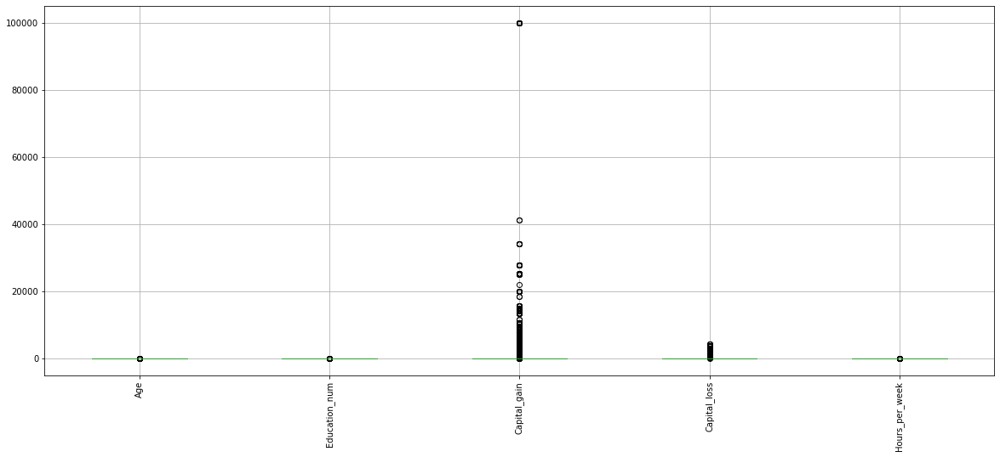

In [577]:
cen.boxplot( rot = 90, figsize=(20,8))


In [578]:
numeric=['Age','Education_num','Capital_gain','Capital_loss','Hours_per_week']

In [579]:
from scipy.stats import zscore
z=np.abs(zscore(cen[numeric]))
cen_new=cen[(z<3).all(axis=1)]
print('\nshape before removing outliers',cen.shape)
print('\nshape after removing outliers',cen_new.shape)
cen=cen_new


shape before removing outliers (32560, 14)

shape after removing outliers (30150, 14)


The outliers had been removed 

In [580]:
cen.skew()

Age                0.494157
Education_num     -0.171984
Capital_gain       4.940872
Capital_loss      29.821934
Hours_per_week    -0.354877
dtype: float64

considering +- 0.5 as threshold for skewness
Capital_gain and Capital_loss are the columns who has more skewness.

<AxesSubplot:ylabel='Frequency'>

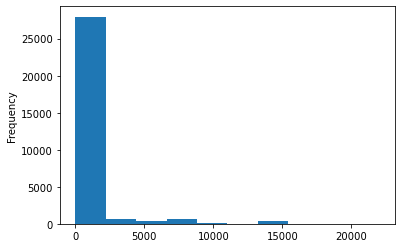

In [581]:
cen['Capital_gain'].plot.hist()

3.074026565031659


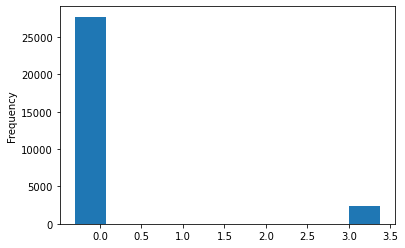

In [582]:
cen['Capital_gain']=power_transform(cen[['Capital_gain']], method='yeo-johnson')
cen['Capital_gain'].plot.hist()
print(skew(cen['Capital_gain']))

<AxesSubplot:ylabel='Frequency'>

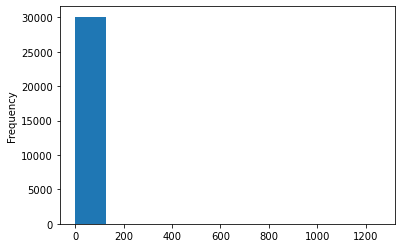

In [583]:
cen['Capital_loss'].plot.hist()

25.002531763372144


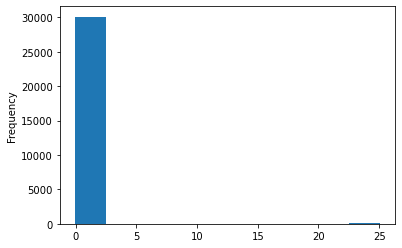

In [584]:
cen['Capital_loss']=power_transform(cen[['Capital_loss']], method='yeo-johnson')
cen['Capital_loss'].plot.hist()
print(skew(cen['Capital_loss']))

The skewness has been removed from above 2 columns 

In [585]:
le = LabelEncoder()

Workclass = le.fit_transform(cen['Workclass'])
Gender = le.fit_transform(cen['Sex'])
Education = le.fit_transform(cen['Education'])
Occupation = le.fit_transform(cen['Occupation'])
Race = le.fit_transform(cen['Race'])
Native_country = le.fit_transform(cen['Native_country'])
Marital_status = le.fit_transform(cen['Marital_status'])
Relationship = le.fit_transform(cen['Relationship'])
Income = le.fit_transform(cen['Income'])


Using label encoder to convert string data to numeric data

In [586]:
cen.drop(['Workclass','Education','Occupation','Race','Sex','Native_country','Marital_status','Relationship','Income'], inplace=True, axis=1)


deleting old columns from dataset

In [587]:
cen['Work_class'] = Workclass
cen['Sex'] = Gender
cen['Education'] = Education
cen['Occupation'] = Occupation
cen['Race'] = Race
cen['Native_country'] = Native_country
cen['Marital_status'] = Marital_status
cen['Relationship'] = Relationship
cen['Income'] = Income
cen.head()

,Age,Education_num,Capital_gain,Capital_loss,Hours_per_week,Work_class,Sex,Education,Occupation,Race,Native_country,Marital_status,Relationship,Income
0,50,13,-0.296674,-0.039932,13,5,1,8,3,4,37,2,0,0
1,38,9,-0.296674,-0.039932,40,3,1,10,5,4,37,0,1,0
2,53,7,-0.296674,-0.039932,40,3,1,1,5,2,37,2,0,0
3,28,13,-0.296674,-0.039932,40,3,0,8,9,2,4,2,5,0
4,37,14,-0.296674,-0.039932,40,3,0,11,3,4,37,2,5,0



Adding new columns to dataset

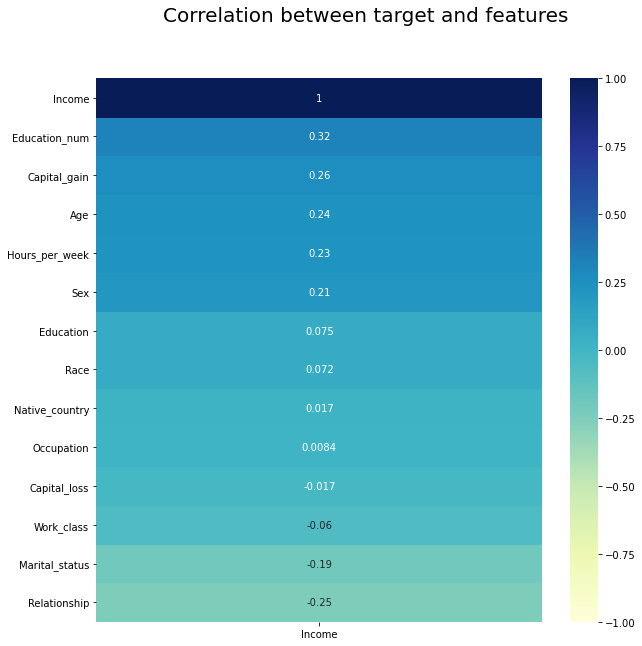

In [588]:
fig, ax = plt.subplots(figsize=(10,10))
fig.suptitle('Correlation between target and features',fontsize=20)
ax=sns.heatmap(cen.corr()[["Income"]].sort_values("Income"),vmax=1, vmin=-1, cmap="YlGnBu", annot=True, ax=ax);
ax.invert_yaxis()

Standarizing all the numerical feature

In [589]:
from sklearn.preprocessing import StandardScaler
cen[['Age','Education_num','Capital_gain','Capital_loss','Hours_per_week']] = StandardScaler().fit_transform(cen[['Age','Education_num','Capital_gain','Capital_loss','Hours_per_week']])

Scaling the dataset

In [590]:
from sklearn.model_selection import train_test_split
y = cen.iloc[:,-1]
x = cen.iloc[:,:-1]

print(x.shape)
print(y.shape)
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=0.2, random_state=42)

(30150, 13)
(30150,)


distributing data in x and y for performing ML

In [591]:
from sklearn.decomposition import PCA

pca = PCA(.95)
pca.fit(x_train)
x_train = pca.transform(x_train)
x_test = pca.transform(x_test)

Performing PCA on training dataset

In [592]:
from sklearn.linear_model import LogisticRegression

models = []
models.append(('AdaBoost', AdaBoostClassifier()))
models.append(('GradientBoosting', GradientBoostingClassifier()))
models.append(('Random forest', RandomForestClassifier()))
models.append(('Logistic Regression', LogisticRegression(max_iter=100000)))



# evaluate each model in turn

seed = 7
kfold = model_selection.KFold(n_splits=10, random_state=seed)
for name, model in models:
  
    i=i+1
    model.fit(x_train, y_train)

    y_pred = model.predict(x_test)

    a=model.score(x_train, y_train)



    b=model.score(x_test, y_test)
    if name=='AdaBoost':
        yp_boost=y_pred
    elif name=='GradientBoosting':
        yp_Grid=y_pred
    elif name=='Random forest':
        yp_Rfor=y_pred
    else :
        yp_log=y_pred
        




    msg = "%s:\n Training Score: %f \n Testing Score: %f " % (name,a,b)
    print(msg)
    print('\n')
    print(classification_report(y_test, y_pred))

    sc = cross_val_score(model, x_test, y_test, cv=35)
   
    

 
   
    print('Cross val score is :',sc.mean())
    print('\n ')
    acc=accuracy_score(y_test, y_pred)
    print('Difference between accuracy score and cross validation score is :',acc-sc.mean())
   
    print('\n --------------------------------------------------------\n')
    
    
    
    
    
   
en= VotingClassifier(models)
results = model_selection.cross_val_score(en, x, y, cv=kfold)
print(results.mean())

AdaBoost:
 Training Score: 0.842910 
 Testing Score: 0.840299 


              precision    recall  f1-score   support

           0       0.87      0.94      0.90      4648
           1       0.71      0.51      0.60      1382

    accuracy                           0.84      6030
   macro avg       0.79      0.73      0.75      6030
weighted avg       0.83      0.84      0.83      6030

Cross val score is : 0.8370019011771936

 
Difference between accuracy score and cross validation score is : 0.003296606285492887

 --------------------------------------------------------

GradientBoosting:
 Training Score: 0.853980 
 Testing Score: 0.840796 


              precision    recall  f1-score   support

           0       0.87      0.94      0.90      4648
           1       0.71      0.52      0.60      1382

    accuracy                           0.84      6030
   macro avg       0.79      0.73      0.75      6030
weighted avg       0.83      0.84      0.83      6030

Cross val score is

Using for loop to perfom different algorithms 
logistic regression has performed best for above dataset

# Hyperparameter tuning

In [597]:
from sklearn.datasets import make_blobs
from sklearn.model_selection import RepeatedStratifiedKFold

x,y = make_blobs(n_samples=1000, centers=2, n_features=100, cluster_std=20)

model = LogisticRegression()
solvers = ['newton-cg', 'lbfgs', 'liblinear']
penalty = ['l2']
c_values = [100, 10, 1.0, 0.1, 0.01]

grid = dict(solver=solvers,penalty=penalty,C=c_values)
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='accuracy',error_score=0)
grid_result = grid_search.fit(x_train, y_train)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']


Best: 0.804630 using {'C': 10, 'penalty': 'l2', 'solver': 'lbfgs'}


The logistic regression has performed better with tuning with Best: 0.974667 using {'C': 0.01, 'penalty': 'l2', 'solver': 'liblinear'}

0.8237085461963628


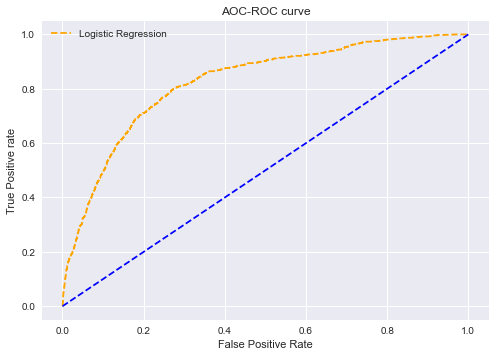

In [598]:
pred_prob1 = grid_search.best_estimator_.predict_proba(x_test)

fpr1, tpr1, thresh1 = roc_curve(y_test, pred_prob1[:,1], pos_label=1)

random_probs = [0 for i in range(len(y_test))]

p_fpr, p_tpr, _ = roc_curve(y_test, random_probs, pos_label=1)

auc_score1 = roc_auc_score(y_test, pred_prob1[:,1])

print(auc_score1)


plt.style.use('seaborn')

# plot roc curves
plt.plot(fpr1, tpr1, linestyle='--',color='orange', label='Logistic Regression')

plt.plot(p_fpr, p_tpr, linestyle='--', color='blue')
# title
plt.title('AOC-ROC curve')
# x label
plt.xlabel('False Positive Rate')
# y label
plt.ylabel('True Positive rate')

plt.legend(loc='best')
plt.savefig('ROC',dpi=300)
plt.show();

The above visualization demonstartes AOC-ROC curve for the above dataset

# Saving model

In [594]:
import joblib
joblib.dump(grid_search.best_estimator_,"census_ml.obj")

['census_ml.obj']